# Main Aggregation Script - calls lab.py and crystals.py

In [26]:
#Reloads the lab.py and crystals.py modules to update any changes (after saving)
#If a new method or object is created, autoreload doesn't work and the 
#kernel needs to be closed and halted after saving and making a 'checkpoint'
#in this notebook
#If you want to save the instance variable associated with lab.main_ar_loop, don't run this cell
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [72]:
!jupyter kernelspec list  #list available kernels
!jupyter notebook list
#Bad magic number error fix:
#find . -name '*.pyc' -delete

Available kernels:
  ipas_env    /Users/vprzybylo/Library/Jupyter/kernels/ipas_env
  myenv       /Users/vprzybylo/Library/Jupyter/kernels/myenv
  python3     /usr/local/share/jupyter/kernels/python3
Currently running servers:
http://localhost:8888/?token=6707eb39f431cf072578b1589eb7a856fc9af6cb58b730f0 :: /Users/vprzybylo/Desktop/icefiles/IPAS_python


In [27]:
#show plots in the notebook, formatting of the plots changes
%matplotlib inline
from ipas import lab_copy_Sconstrain as lab
from ipas import IceCrystal as crys
import numpy as np
import time  #for efficiency tests
import itertools   #to create width array and join plate/col aspect ratios
from operator import itemgetter
import shapely.geometry as geom
import matplotlib.pyplot as plt
import scipy.optimize as opt
import random
import warnings
from shapely.geometry import Point
import pickle

#### Loops over aspect ratios, creates histograms of each aspect ratio

##### 'PATH' VARIABLE NEEDS TO BE CHANGED IN lap_copy.py BEFORE RUNNING -- ALL FOLDERS/FILES WILL BE CREATED IF THEY DO NOT EXIST 


eq. vol rad 9.999999999999996 0.4641588833612778 46.41588833612778 0.01


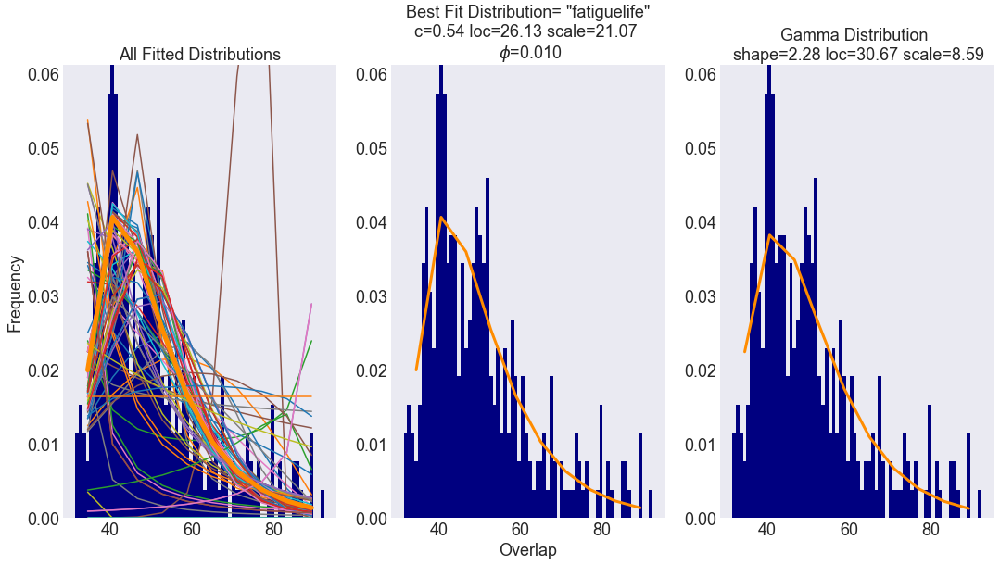

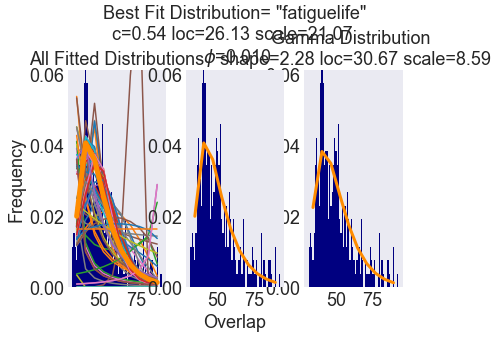

ch (37.459923688608015, 2.2829649427754455)
[37.45992369]


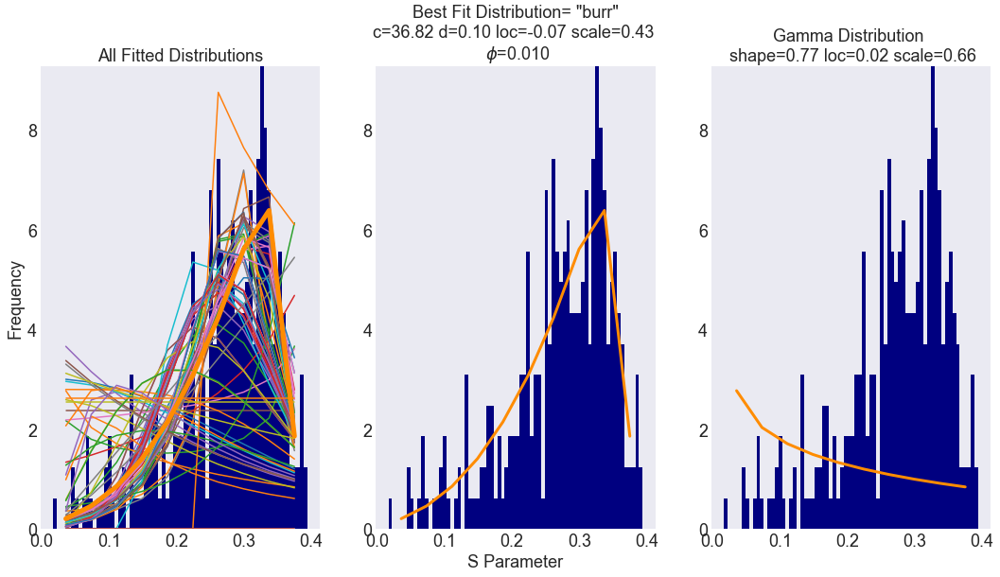

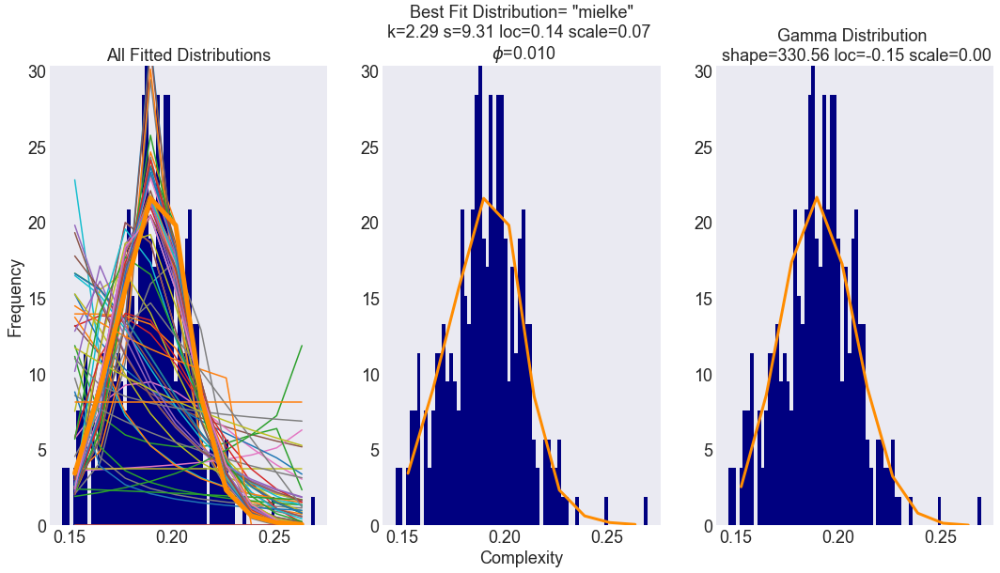

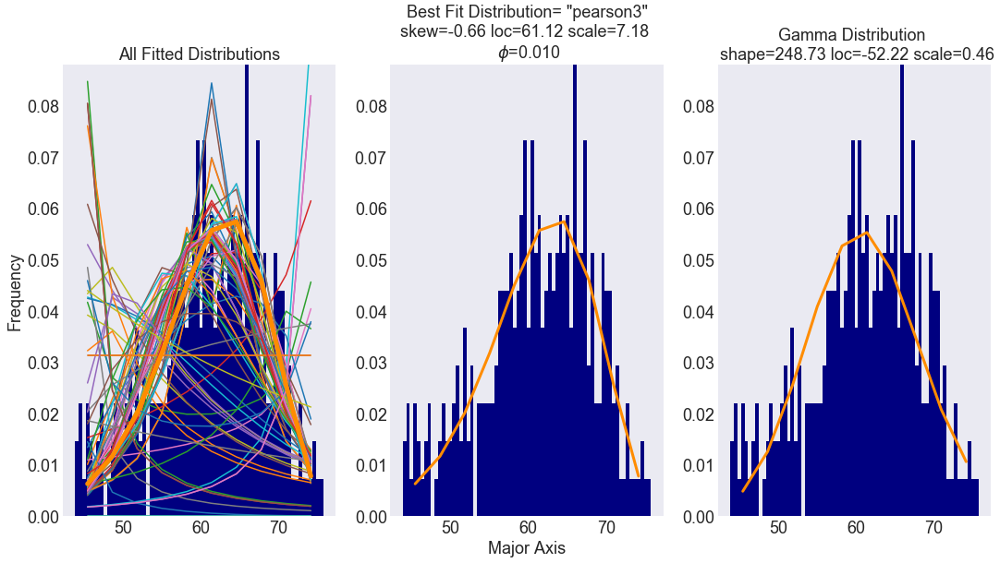

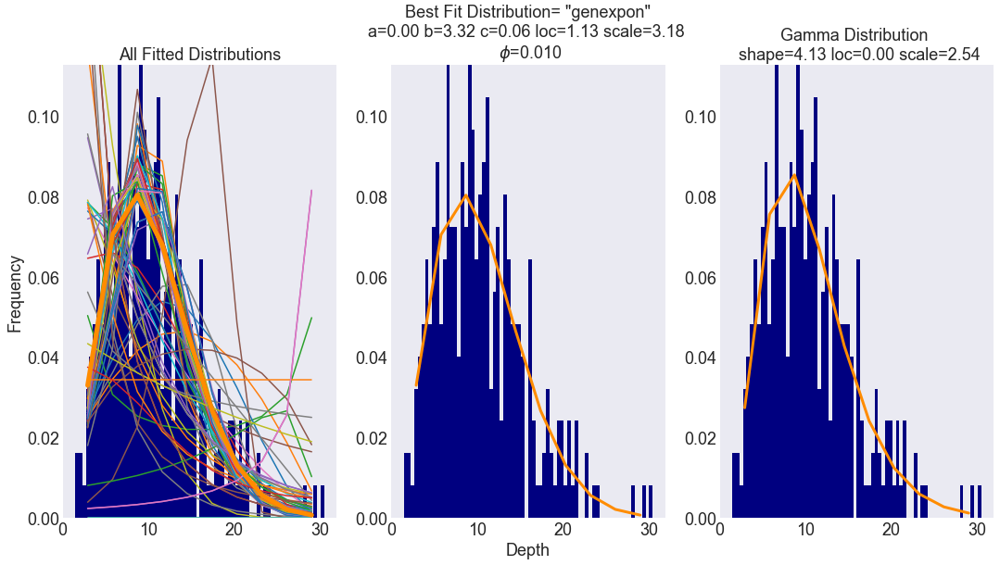

--- 2.36 minute(s) ---
eq. vol rad 9.999999999999996 0.5261243901795325 43.596917354484766 0.012067926406393288


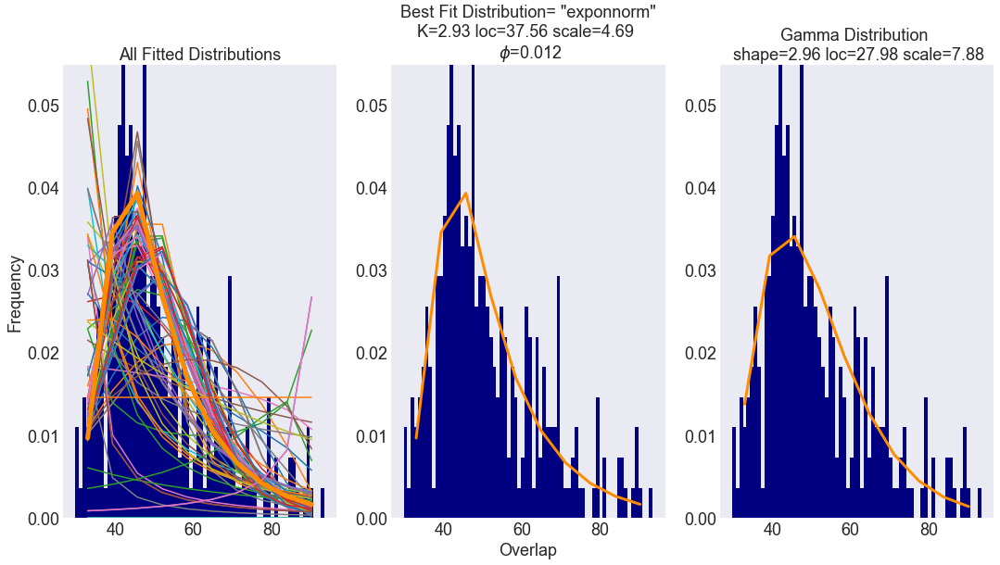

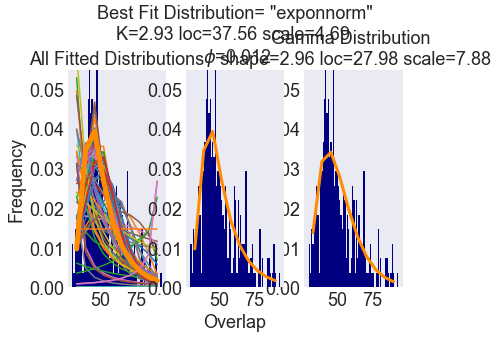

ch (42.43147369806542, 2.9630446447087166)
[42.4314737]


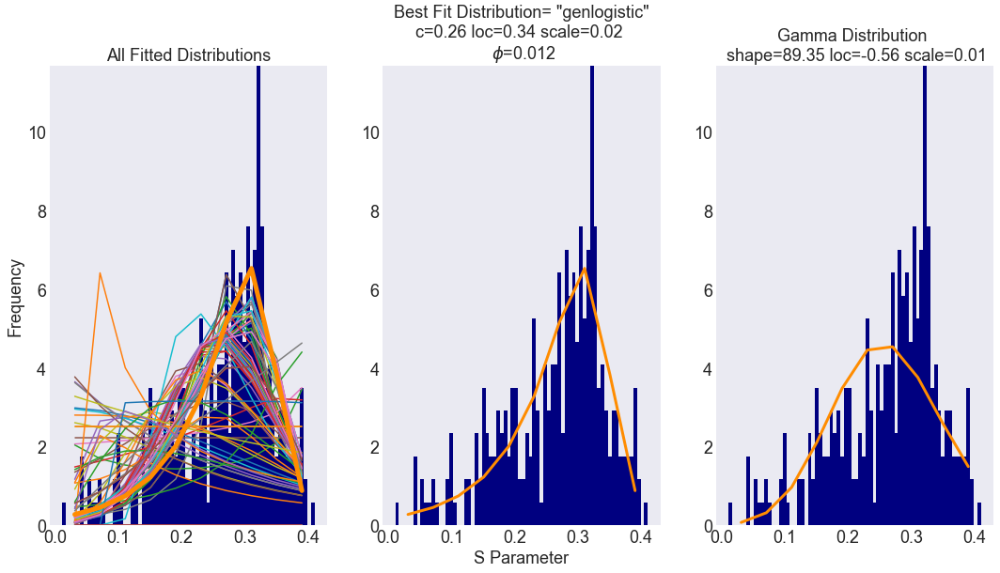

KeyboardInterrupt: 

In [207]:
phio=np.logspace(-2, 2, num=50, endpoint=True, base=10.0, dtype=None)#just columns (0,2); plates (-2,0)
#add=np.logspace(-.301, .301, num=5, endpoint=True, base=10.0, dtype=None)
#phio = sorted(np.append(phio, add, axis=0))

#phio = [.01,.02,.03,.04,.05,.06,.07,.08,.09,.1,.2,.3,.4,\
#        .5,.6,.7,.8,.9,1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100]
#reqarr = [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500,600,700,800,900,1000]
#reqarr = [1,2]
numaspectratios=len(phio)
ch_dist='gamma'         #anything other than gamma uses the characteristic from the best distribution pdf (lowest SSE)
nclusters = 300        #changes how many aggregates per aspect ratio to consider
ncrystals = 2          #number of monomers per aggregate
minor = 'depth'        #'minorxy' from fit ellipse or 'depth' to mimic IPAS in IDL
rand_orient = False     #randomly orient the seed crystal and new crystal: uses first random orientation
save_plots = False     #saves all histograms to path with # of aggs and minor/depth folder
file_ext = 'eps'

#Note, there may be a shape parameter erlang distribution run time warning occasionally if warning filter
#is turned off, disregard it

warnings.filterwarnings("ignore")

#If creating lookup table using lab_lookup use this call to main_ar_loop:
#AND change import from lab_copy to lab_lookup in import statement above
#p300lookup = lab.main_ar_loop(phio, reqarr, numaspectratios, ch_dist, nclusters, 
#                              ncrystals, minor, rand_orient, save_plots, file_ext)
#Otherwise:
#radius for aggregate  depth and major ax but no 4/3pi constants
test = lab.main_ar_loop(phio, numaspectratios, ch_dist, nclusters, 
                           ncrystals, minor, rand_orient, save_plots, file_ext)


In [202]:
center1.which_plot(nclusters, plot_name ='S', ch_dist=ch_dist, savefile = 'Sparam_box_noconst_ctr2',
              save=True, ext=file_ext, verbose=True)
center1.which_plot(nclusters, plot_name ='overlap', ch_dist=ch_dist, savefile = 'ovrlp_noconst_ctr2',
              save=True, ext=file_ext, verbose=True)

Saving figure to '/Users/vprzybylo/Desktop/icefiles/agg_model/agg_notes/graphics/python/300xtals_hist/depth/Sparam_box_noconst_ctr2.eps'...
[[1.74611930e+01]
 [2.42423826e+01]
 [2.49403655e+01]
 [2.53943082e+01]
 [1.70695477e+01]
 [1.78082339e+01]
 [2.45934009e+01]
 [2.43378039e+01]
 [2.37297702e+01]
 [2.51605097e+01]
 [1.85424435e+01]
 [1.71185273e+01]
 [2.50009152e+01]
 [1.78998583e+01]
 [2.55212309e+01]
 [2.56564170e+01]
 [2.40594032e+01]
 [2.63306144e+01]
 [2.60975238e+01]
 [1.78186858e+01]
 [2.50565575e+01]
 [2.49364986e+01]
 [2.38941082e+01]
 [2.11504288e+01]
 [2.08908700e+01]
 [2.06680704e+01]
 [1.87081895e+01]
 [2.27177597e+01]
 [2.09375825e+01]
 [1.87219868e+01]
 [1.78309772e+01]
 [1.35895203e+01]
 [7.85063927e+00]
 [3.60545787e-03]
 [9.51817488e+00]
 [4.81443096e+00]
 [1.44971149e-03]
 [4.36458269e+00]
 [5.64850797e-02]
 [6.73602026e-04]
 [7.62226248e-04]
 [1.61460675e-02]
 [4.10258122e-02]
 [2.22564248e-02]
 [9.79997581e-02]
 [1.14240304e-01]
 [3.03628448e-06]
 [3.32475884e-

In [34]:
object = const2_new
filename = 'instance_output_2_const2_new'
filehandler = open(filename, 'wb')
pickle.dump(object, filehandler, 0)
filehandler.close()

PicklingError: Can't pickle <class 'ipas.plots_Sconstrain.Make_Plots'>: it's not the same object as ipas.plots_Sconstrain.Make_Plots

In [39]:
file = open('instance_output_2_const_new', 'rb')
object_pi2 = pickle.load(file)
print(object_pi2.ch_depth)

[ 12.93807985   9.71025898  10.59671355  10.41246674   8.97683723
   9.44546118   9.40119963   8.59813337   8.60673817   8.99118124
  10.39334668  11.70037559  11.5146415   12.54462017  14.05020012
  14.12745707  15.82627276  16.73070325  17.61042474  17.28309537  18.03214
  17.05324249  16.89544362  16.537384    17.00614678  17.49808791
  16.40797309  16.5909552   17.36737249  17.19760279  17.0402031
  19.33479877  18.78896993  18.0492993   19.87994733  19.61197471
  20.8042307   18.14787955  19.60379436  21.27637693  21.26095548
  29.23715712  26.81543531  25.17338797  29.20020327  38.08325937
  46.27647941  51.76425077  59.44922641  58.74865617]


In [71]:
ovrlp2_nominus.which_plot(nclusters, plot_name ='overlap', ch_dist=ch_dist, savefile = 'ovrlp_nominus',
              save=True, ext='eps', verbose=True)
#multi5.which_plot(nclusters, plot_name ='S_contour', ch_dist=ch_dist, savefile = 'S_contour',
#              save=True, ext='eps', verbose=True)
#multi5.which_plot(nclusters, plot_name ='phi_contour', ch_dist=ch_dist, savefile = 'phi_contour_rand',
#              save=True, ext=file_ext, verbose=True)


Saving figure to '/Users/vprzybylo/Desktop/icefiles/agg_model/agg_notes/graphics/python/5crystals/30xtals_hist/depth/phi_contour_rand.eps'...


In [193]:
cluster = np.array([[(  -7.65271687,   36.2290185 ,   14.25556587),
  ( -42.81795007,   50.61245378,   40.9193588 ),
  ( -38.70310433,   89.65180826,   65.68690887),
  (   0.57697461,  114.30772745,   63.79066601),
  (  35.74220782,   99.92429217,   37.12687309),
  (  31.62736207,   60.88493769,   12.35932302),
  (  -7.31205013,   35.74108864,   14.96805764),
  ( -42.47728334,   50.12452393,   41.63185056),
  ( -38.36243759,   89.16387841,   66.39940063),
  (   0.91764135,  113.8197976 ,   64.50315777),
  (  36.08287455,   99.43636231,   37.83936485),
  (  31.96802881,   60.39700784,   13.07181478)],
 [(  16.63330757,   45.05509029,   16.8829059 ),
  (  52.85080104,   73.78076968,   12.69205871),
  (  49.91136014,  110.95473864,  -14.94650871),
  (  10.75442576,  119.4030282 ,  -38.39422894),
  ( -25.46306771,   90.67734881,  -34.20338175),
  ( -22.5236268 ,   53.50337985,   -6.56481433),
  (  16.95081426,   44.55091841,   16.17102523),
  (  53.16830773,   73.2765978 ,   11.98017804),
  (  50.22886683,  110.45056676,  -15.65838939),
  (  11.07193246,  118.89885632,  -39.10610962),
  ( -25.14556101,   90.17317693,  -34.91526242),
  ( -22.20612011,   52.99920797,   -7.276695  )],
 [(  14.96725287,   35.65178121,  -77.76193153),
  (  22.96641279,   45.14813278,  -33.03758204),
  (  15.6095554 ,   87.97777158,  -16.73011811),
  (   0.2535381 ,  121.31105881,  -45.14700368),
  (  -7.74562182,  111.81470724,  -89.87135317),
  (  -0.38876443,   68.98506844, -106.17881709),
  (  15.84326427,   35.88039171,  -77.9671513 ),
  (  23.84242418,   45.37674328,  -33.24280181),
  (  16.4855668 ,   88.20638208,  -16.93533788),
  (   1.12954949,  121.53966931,  -45.35222345),
  (  -6.86961043,  112.04331773,  -90.07657294),
  (   0.48724696,   69.21367893, -106.38403687)],
 [(  99.32742495,  147.57053011,   21.32876838),
  (  76.22185896,  143.11822706,   61.33807365),
  (  45.72923429,  108.55329493,   66.80616261),
  (  38.34217561,   78.44066583,   32.26494632),
  (  61.4477416 ,   82.89296888,   -7.74435895),
  (  91.94036628,  117.45790102,  -13.21244792),
  (  98.65147307,  148.11466835,   20.99895554),
  (  75.54590708,  143.6623653 ,   61.00826081),
  (  45.0532824 ,  109.09743316,   66.47634977),
  (  37.66622373,   78.98480407,   31.93513348),
  (  60.77178972,   83.43710712,   -8.07417179),
  (  91.26441439,  118.00203925,  -13.54226075)],
 [( 137.99943629,   73.97245066,   38.62210796),
  ( 119.17086481,   79.69037871,   -3.416266  ),
  (  73.43318381,   86.36866523,   -7.64707157),
  (  46.52407429,   87.32902371,   30.1604968 ),
  (  65.35264578,   81.61109566,   72.19887076),
  ( 111.09032678,   74.93280914,   76.42967633),
  ( 137.8717896 ,   73.05543586,   38.55455016),
  ( 119.04321812,   78.77336391,   -3.48382379),
  (  73.30553712,   85.45165044,   -7.71462937),
  (  46.3964276 ,   86.41200891,   30.09293901),
  (  65.22499908,   80.69408086,   72.13131296),
  ( 110.96268008,   74.01579434,   76.36211854)],
 [(  -8.96874047,   44.10495078,    8.11275265),
  (   9.29340372,   10.15124253,   33.95988936),
  ( -13.33817942,  -30.08714935,   38.76800264),
  ( -54.23190675,  -36.37183299,   17.72897921),
  ( -72.49405094,   -2.41812474,   -8.11815751),
  ( -49.8624678 ,   37.82026714,  -12.92627079),
  (  -9.40498524,   44.43968343,    8.86069544),
  (   8.85715894,   10.48597518,   34.70783215),
  ( -13.7744242 ,  -29.7524167 ,   39.51594543),
  ( -54.66815152,  -36.03710034,   18.476922  ),
  ( -72.93029571,   -2.08339209,   -7.37021471),
  ( -50.29871257,   38.15499979,  -12.17832799)],
 [(  18.1741456 ,   71.92455616, -105.89052803),
  (  55.38107502,   52.56721946,  -86.00654933),
  (  70.26363154,   67.86388132,  -44.78815129),
  (  47.93925865,  102.51787988,  -23.45373194),
  (  10.73232922,  121.87521658,  -43.33771064),
  (  -4.1502273 ,  106.57855472,  -84.55610869),
  (  18.72245897,   72.54036091, -106.3170381 ),
  (  55.92938839,   53.18302421,  -86.4330594 ),
  (  70.81194491,   68.47968607,  -45.21466135),
  (  48.48757202,  103.13368462,  -23.88024201),
  (  11.2806426 ,  122.49102132,  -43.76422071),
  (  -3.60191393,  107.19435947,  -84.98261875)],
 [( -19.73900199,  -30.07992884,   33.22852422),
  ( -17.70878827,  -59.24297535,   69.28167445),
  ( -29.36954646, -103.82866525,   63.75196704),
  ( -43.06051838, -119.25130866,   22.16910941),
  ( -45.0907321 ,  -90.08826215,  -13.88404081),
  ( -33.42997391,  -45.50257225,   -8.3543334 ),
  ( -20.61901931,  -29.87634294,   33.44275817),
  ( -18.58880558,  -59.03938944,   69.49590839),
  ( -30.24956377, -103.62507935,   63.96620098),
  ( -43.94053569, -119.04772275,   22.38334335),
  ( -45.97074941,  -89.88467625,  -13.66980687),
  ( -34.30999122,  -45.29898634,   -8.14009946)],
 [( -61.6649655 , -148.58624393,   32.18197701),
  ( -37.01347045, -187.79105337,   35.29989263),
  (   6.41383167, -189.25909855,   18.97969152),
  (  25.18963873, -151.52233429,   -0.45842521),
  (   0.53814367, -112.31752484,   -3.57634083),
  ( -42.88915844, -110.84947966,   12.74386028),
  ( -61.98558754, -148.85378404,   31.35288252),
  ( -37.33409248, -188.05859349,   34.47079814),
  (   6.09320964, -189.52663867,   18.15059703),
  (  24.8690167 , -151.7898744 ,   -1.2875197 ),
  (   0.21752164, -112.58506495,   -4.40543532),
  ( -43.20978048, -111.11701977,   11.91476579)],
 [(  20.63336746,  -29.69216848,  -33.65221362),
  ( -19.49988707,  -37.14328872,  -11.55611945),
  ( -44.75602901,   -1.20407688,    3.44171495),
  ( -29.8789164 ,   42.18625521,   -3.65654482),
  (  10.25433813,   49.63737546,  -25.75263899),
  (  35.51048007,   13.69816362,  -40.75047339),
  (  21.08407734,  -29.71398575,  -32.84094395),
  ( -19.04917719,  -37.165106  ,  -10.74484978),
  ( -44.30531913,   -1.22589415,    4.25298462),
  ( -29.42820653,   42.16443794,   -2.84527514),
  (  10.70504801,   49.61555819,  -24.94136931),
  (  35.96118994,   13.67634634,  -39.93920371)],
 [( 108.17750827,  104.75642776,  107.59609029),
  ( 113.23022357,   76.57526502,   71.06217695),
  ( 144.65746269,   42.43819943,   72.25552702),
  ( 171.03198651,   36.48229659,  109.98279043),
  ( 165.97927121,   64.66345933,  146.51670377),
  ( 134.55203209,   98.80052492,  145.32335371),
  ( 108.81475971,  105.33068951,  107.24125522),
  ( 113.86747501,   77.14952676,   70.70734188),
  ( 145.29471413,   43.01246117,   71.90069195),
  ( 171.66923795,   37.05655833,  109.62795536),
  ( 166.61652265,   65.23772108,  146.16186871),
  ( 135.18928353,   99.37478667,  144.96851864)],
 [( -66.43924601, -243.36532779,  -21.78280082),
  ( -85.84860403, -235.86853445,   19.70827775),
  ( -72.62285117, -199.45920637,   45.279257  ),
  ( -39.98774029, -170.54667162,   29.35915768),
  ( -20.57838227, -178.04346496,  -12.1319209 ),
  ( -33.80413513, -214.45279305,  -37.70290014),
  ( -65.78300259, -243.88529607,  -21.38186263),
  ( -85.19236061, -236.38850273,   20.10921594),
  ( -71.96660775, -199.97917465,   45.68019519),
  ( -39.33149687, -171.0666399 ,   29.76009587),
  ( -19.92213885, -178.56343324,  -11.7309827 ),
  ( -33.14789171, -214.97276132,  -37.30196195)],
 [( -42.04207598,   51.89781995,  -81.5910784 ),
  ( -31.32380375,   46.60402583,  -36.74100511),
  (   6.93719499,   23.28940643,  -24.61833262),
  (  34.47992148,    5.26858114,  -57.34573342),
  (  23.76164925,   10.56237526, -102.19580672),
  ( -14.49934948,   33.87699466, -114.31847921),
  ( -42.53041053,   51.10867591,  -81.56752133),
  ( -31.81213829,   45.8148818 ,  -36.71744804),
  (   6.44886044,   22.50026239,  -24.59477555),
  (  33.99158693,    4.47943711,  -57.32217635),
  (  23.2733147 ,    9.77323123, -102.17224964),
  ( -14.98768403,   33.08785063, -114.29492213)],
 [( -48.38602514, -136.43835231,   19.40780978),
  ( -65.40268884,  -96.14213029,    3.8809834 ),
  ( -42.9377226 ,  -72.70520915,  -29.29235996),
  (  -3.45609267,  -89.56451003,  -46.93887695),
  (  13.56057103, -129.86073205,  -31.41205057),
  (  -8.9043952 , -153.29765319,    1.76129279),
  ( -47.90198343, -135.9839395 ,   20.05664451),
  ( -64.91864714,  -95.68771748,    4.52981813),
  ( -42.4536809 ,  -72.25079634,  -28.64352523),
  (  -2.97205097,  -89.11009723,  -46.29004221),
  (  14.04461273, -129.40631925,  -30.76321583),
  (  -8.4203535 , -152.84324039,    2.41012753)],
 [( -98.21167615,  -18.94038063,  -31.73938228),
  (-104.96642539,    0.98333173,    9.63517196),
  ( -77.34841952,   -9.76866609,   45.35736373),
  ( -42.97566442,  -40.44437627,   39.70500126),
  ( -36.22091518,  -60.36808863,   -1.66955299),
  ( -63.83892105,  -49.61609081,  -37.39174475),
  ( -98.78712609,  -19.62897205,  -31.50174159),
  (-105.54187533,    0.2947403 ,    9.87281265),
  ( -77.92386946,  -10.45725752,   45.59500442),
  ( -43.55111435,  -41.1329677 ,   39.94264194),
  ( -36.79636512,  -61.05668006,   -1.4319123 ),
  ( -64.41437099,  -50.30468223,  -37.15410407)],
 [(-104.91983779,  -70.94824782,  -76.21783519),
  ( -88.66791723,  -28.35021671,  -67.51625408),
  ( -95.9089737 ,   -8.76778601,  -26.06109518),
  (-119.40195075,  -31.78338642,    6.6924826 ),
  (-135.65387131,  -74.38141752,   -2.00909851),
  (-128.41281484,  -93.96384822,  -43.4642574 ),
  (-105.71367644,  -70.58168893,  -76.52965029),
  ( -89.46175587,  -27.98365782,  -67.82806918),
  ( -96.70281235,   -8.40122712,  -26.37291028),
  (-120.19578939,  -31.41682753,    6.3806675 ),
  (-136.44770996,  -74.01485863,   -2.32091361),
  (-129.20665348,  -93.59728933,  -43.7760725 )],
[(-118.39602867, -201.69992319,  -7.39548263),
 ( -95.43266184, -179.30414689,  26.15370033),
 (-103.68085768, -134.28045463,  33.85234242),
 (-134.89242037, -111.65253866,   8.00180154),
 (-157.85578721, -134.04831496, -25.54738143),
 (-149.60759136, -179.07200722, -33.24602351),
 (-117.73026767, -201.47428289,  -8.00180154),
 ( -94.76690083, -179.07850659,  25.54738143),
 (-103.01509668, -134.05481433,  33.24602351),
 (-134.22665936, -111.42689836,   7.39548263),
 (-157.1900262 , -133.82267466, -26.15370033),
 (-148.94183035, -178.84636692, -33.85234242)]],
   dtype=[('x', float), ('y', float), ('z', float)])

new_crystal = np.array([[( 295.11226811,  17.4263934 , -28.01664381),
 ( 277.11766092, -24.77038742, -35.09198768),
 ( 243.4230469 , -40.58016088,  -7.35827643),
 ( 227.72304008, -14.19315352,  27.45077869),
 ( 245.71764727,  28.0036273 ,  34.52612256),
 ( 279.41226129,  43.81340075,   6.79241131),
 ( 295.75018742,  17.05947447, -27.45077869),
 ( 277.75558023, -25.13730635, -34.52612256),
 ( 244.06096621, -40.94707981,  -6.79241131),
 ( 228.36095939, -14.56007245,  28.01664381),
 ( 246.35556658,  27.63670837,  35.09198768),
 ( 280.0501806 ,  43.44648182,   7.35827643)]],
dtype=[('x', float), ('y', float), ('z', float)])

In [174]:
cluster = np.array([[(-13.64985689, -52.4928227 ,  0.23662677),
  ( 30.18328806, -67.75888983,  0.04352574),
  ( 65.3200883 , -37.43103992, -0.20442379),
  ( 56.62374359,   8.16287711, -0.2592723 ),
  ( 12.79059864,  23.42894424, -0.06617127),
  (-22.34620161,  -6.89890567,  0.18177826),
  (-13.654654  , -52.49485441, -0.69167638),
  ( 30.17849095, -67.76092153, -0.88477741),
  ( 65.31529119, -37.43307163, -1.13272694),
  ( 56.61894648,   8.1608454 , -1.18757545),
  ( 12.78580153,  23.42691253, -0.99447442),
  (-22.35099872,  -6.90093737, -0.74652489)],
 [( 21.78973872,  38.9477925 ,  1.07345383),
  (-14.37853261,  68.03649664,  0.70179443),
  (-57.65533598,  51.25748989,  0.56795855),
  (-64.76386804,   5.38977901,  0.80578208),
  (-28.59559671, -23.69892513,  1.17744148),
  ( 14.68120667,  -6.91991839,  1.31127736),
  ( 21.79477845,  38.94219829,  0.1451666 ),
  (-14.37349288,  68.03090243, -0.2264928 ),
  (-57.65029625,  51.25189568, -0.36032868),
  (-64.7588283 ,   5.3841848 , -0.12250515),
  (-28.59055698, -23.70451934,  0.24915425),
  ( 14.6862464 ,  -6.9255126 ,  0.38299013)]],
dtype=[('x', float), ('y', float), ('z', float)])

new_crystal = np.array([(  0.30519393, 61.11378115, 1.54892817),
 (-35.8630774 , 90.20248529, 1.17726877),
 (-79.13988078, 73.42347854, 1.04343289),
 (-86.24841283, 27.55576766, 1.28125642),
 (-50.0801415 , -1.53293649, 1.65291582),
 ( -6.80333812, 15.24607026, 1.7867517 ),
 (  0.31023366, 61.10818694, 0.62064094),
 (-35.85803767, 90.19689108, 0.24898154),
 (-79.13484105, 73.41788433, 0.11514566),
 (-86.2433731 , 27.55017345, 0.35296919),
 (-50.07510177, -1.5385307 , 0.72462859),
 ( -6.79829839, 15.24047605, 0.85846447)],
dtype=[('x', float), ('y', float), ('z', float)])

In [168]:
cluster = np.array([[(-10.61428927,  28.80317693, -0.65967957),
  (-35.79305709, -10.18884266, -0.36514714),
  (-14.6134371 , -51.490119  , -0.1142304 ),
  ( 31.74495071, -53.79937577, -0.15784609),
  ( 56.92371854, -14.80735618, -0.45237852),
  ( 35.74409855,  26.49392017, -0.70329526),
  (-10.61547383,  28.79692982, -1.58797556),
  (-35.79424166, -10.19508977, -1.29344313),
  (-14.61462167, -51.49636611, -1.04252639),
  ( 31.74376615, -53.80562288, -1.08614208),
  ( 56.92253397, -14.81360329, -1.38067451),
  ( 35.74291399,  26.48767306, -1.63159125)],
 [(  2.0844735 ,  57.14899535,  1.97925277),
  (-42.91594354,  45.78160328,  1.55551511),
  (-55.56804646,   1.12797494,  0.9132861 ),
  (-23.21973233, -32.15826132,  0.69479476),
  ( 21.78068471, -20.79086925,  1.11853242),
  ( 34.43278763,  23.86275908,  1.76076143),
  (  2.09025545,  57.16070727,  1.0510269 ),
  (-42.91016159,  45.7933152 ,  0.62728923),
  (-55.56226451,   1.13968686, -0.01493978),
  (-23.21395038, -32.1465494 , -0.23343112),
  ( 21.78646666, -20.77915733,  0.19030654),
  ( 34.43856958,  23.874471  ,  0.83253555)]],
dtype=[('x', float), ('y', float), ('z', float)])

new_crystal = np.array([( -8.48026494,  69.65021832, 2.8521636 ),
 (-53.48068198,  58.28282625, 2.42842593),
 (-66.1327849 ,  13.62919792, 1.78619693),
 (-33.78447077, -19.65703835, 1.56770558),
 ( 11.21594627,  -8.28964628, 1.99144325),
 ( 23.86804918,  36.36398206, 2.63367225),
 ( -8.47448299,  69.66193024, 1.92393772),
 (-53.47490003,  58.29453817, 1.50020006),
 (-66.12700295,  13.64090984, 0.85797105),
 (-33.77868882, -19.64532643, 0.63947971),
 ( 11.22172822,  -8.27793436, 1.06321737),
 ( 23.87383114,  36.37569398, 1.70544638)],
dtype=[('x', float), ('y', float), ('z', float)])

In [194]:
import plotly as plty
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.graph_objs import *
plty.tools.set_credentials_file(username='V_przybylo', api_key='dLMeh8k4zPW1tltWDpvp')
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools

X = cluster['x']
Y = cluster['y']
Z = cluster['z']

maxX = np.max(X)
minX = np.min(X)
maxY = np.max(Y)
minY = np.min(Y)
maxZ = np.max(Z)
minZ = np.min(Z)
maxxyz = max(maxX, maxY, maxZ)
minxyz = min(minX,minY,minZ)

print(maxxyz, minxyz)

layout = go.Layout(scene=Scene(
xaxis=dict(title='X',showgrid=True, tickangle = 20, showticklabels=True, range=[minxyz, maxxyz],
           tickfont=dict(family='Times New Roman', size=14, color='k')), 
yaxis=dict(title='Y',showgrid=True, tickangle = 20, showticklabels=True,range=[minxyz, maxxyz],
           tickfont=dict(size=14, family='Times New Roman')),
zaxis=dict(title='Z',showgrid=True, tickangle = 20, showticklabels=True,range=[minxyz, maxxyz],
           tickfont=dict(size=14, family='Times New Roman'))),
font=dict(family='Serif', size=16, color='k'),
autosize=False,
width=800,
height=800)
    
x = np.zeros((len(cluster['x']),27))
y = np.zeros((len(cluster['x']),27))
z = np.zeros((len(cluster['x']),27))


data = []
for l in range(len(cluster['x'])):
    prismind = [0,6,7,1,2,8,9,3,4,10,11,5]  #prism lines
    i = 0
    for n in prismind:           
        x[l][i] = X[l][n]
        y[l][i] = Y[l][n]
        z[l][i] = Z[l][n]
        i+=1

    trace_prism = go.Scatter3d(x=x[l][0:12], y=y[l][0:12], z=z[l][0:12], mode = 'lines',
                         line = dict(width = 8, color='#29569F'), showlegend=False)
    data.append(trace_prism)
    
    i = 0   
    for n in range(0,6): #basal face lines 
    
        x[l][i+12] = X[l][n]
        y[l][i+12] = Y[l][n]
        z[l][i+12] = Z[l][n]
        i+=1
        
    x[l][18] = X[l][0]
    y[l][18] = Y[l][0]
    z[l][18] = Z[l][0]
    if l == 0:
        color='red'
    else:
        color='#29569F'
        
    trace_basal1 = go.Scatter3d(x=x[l][12:19], y=y[l][12:19], z=z[l][12:19], mode = 'lines',
                         line = dict(width = 8, color=color), showlegend=False)
    data.append(trace_basal1)
    
    i = 0   
    for n in range(6,12): #basal face lines 
    
        x[l][i+19] = X[l][n]
        y[l][i+19] = Y[l][n]
        z[l][i+19] = Z[l][n]
        i+=1
        
    x[l][25] = X[l][6]
    y[l][25] = Y[l][6]
    z[l][25] = Z[l][6]
    
    trace_basal2 = go.Scatter3d(x=x[l][19:26], y=y[l][19:26], z=z[l][19:26], mode = 'lines',
                         line = dict(width = 8, color='#29569F'), showlegend=False)
    data.append(trace_basal2)
    
    
fig = dict(data=data, layout=layout)    
py.iplot(fig, filename='agg_viz', validate=False)

#py.image.save_as(fig,'/Users/vprzybylo/Desktop/icefiles/agg_model/agg_notes/graphics/maxctang.jpeg',
#                 scale = 2, height = 1200, width= 1600)

171.66923795 -243.88529607


In [169]:
import plotly as plty
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.graph_objs import *
plty.tools.set_credentials_file(username='V_przybylo', api_key='dLMeh8k4zPW1tltWDpvp')
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools

X = cluster['x']
Y = cluster['y']
Z = cluster['z']

maxX = np.max(X)
minX = np.min(X)
maxY = np.max(Y)
minY = np.min(Y)
maxZ = np.max(Z)
minZ = np.min(Z)
maxxyz = max(maxX, maxY, maxZ)
minxyz = min(minX,minY,minZ)

print(maxxyz, minxyz)

layout = go.Layout(scene=Scene(
xaxis=dict(title='X',showgrid=True, tickangle = 20, showticklabels=True, range=[minxyz, maxxyz],
           tickfont=dict(family='Times New Roman', size=14, color='k')), 
yaxis=dict(title='Y',showgrid=True, tickangle = 20, showticklabels=True,range=[minxyz, maxxyz],
           tickfont=dict(size=14, family='Times New Roman')),
zaxis=dict(title='Z',showgrid=True, tickangle = 20, showticklabels=True,range=[minxyz, maxxyz],
           tickfont=dict(size=14, family='Times New Roman'))),
font=dict(family='Serif', size=16, color='k'),
autosize=False,
width=800,
height=800)
    
x = np.zeros((len(cluster['x']),27))
y = np.zeros((len(cluster['x']),27))
z = np.zeros((len(cluster['x']),27))


data = []
for l in range(len(cluster['x'])):
    prismind = [0,6,7,1,2,8,9,3,4,10,11,5]  #prism lines
    i = 0
    for n in prismind:           
        x[l][i] = X[l][n]
        y[l][i] = Y[l][n]
        z[l][i] = Z[l][n]
        i+=1

    trace_prism = go.Scatter3d(x=x[l][0:12], y=y[l][0:12], z=z[l][0:12], mode = 'lines',
                         line = dict(width = 8, color='#29569F'), showlegend=False)
    data.append(trace_prism)
    
    i = 0   
    for n in range(0,6): #basal face lines 
    
        x[l][i+12] = X[l][n]
        y[l][i+12] = Y[l][n]
        z[l][i+12] = Z[l][n]
        i+=1
        
    x[l][18] = X[l][0]
    y[l][18] = Y[l][0]
    z[l][18] = Z[l][0]
    if l == 0:
        color='red'
    else:
        color='#29569F'
        
    trace_basal1 = go.Scatter3d(x=x[l][12:19], y=y[l][12:19], z=z[l][12:19], mode = 'lines',
                         line = dict(width = 8, color=color), showlegend=False)
    data.append(trace_basal1)
    
    i = 0   
    for n in range(6,12): #basal face lines 
    
        x[l][i+19] = X[l][n]
        y[l][i+19] = Y[l][n]
        z[l][i+19] = Z[l][n]
        i+=1
        
    x[l][25] = X[l][6]
    y[l][25] = Y[l][6]
    z[l][25] = Z[l][6]
    
    trace_basal2 = go.Scatter3d(x=x[l][19:26], y=y[l][19:26], z=z[l][19:26], mode = 'lines',
                         line = dict(width = 8, color='#29569F'), showlegend=False)
    data.append(trace_basal2)
    
    
fig = dict(data=data, layout=layout)    
py.iplot(fig, filename='agg_viz', validate=False)

#py.image.save_as(fig,'/Users/vprzybylo/Desktop/icefiles/agg_model/agg_notes/graphics/maxctang.jpeg',
#                 scale = 2, height = 1200, width= 1600)

57.16070727 -55.56804646


True 155.40930149488693


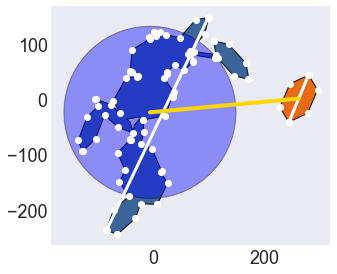

In [45]:
from descartes.patch import PolygonPatch
from shapely.geometry import Point
import descartes
import shapely.ops as shops


#def projectxy(xtal):
#    return geom.MultiPoint(xtal[['x', 'y']]).convex_hull

def projectxy(xtal):
        polygons = [ _crystal_projectxy(xtal, n).buffer(0) for n in range(len(xtal)) ]
        return shops.cascaded_union(polygons)
def _crystal_projectxy(xtal, n):
        return geom.MultiPoint(xtal[n][['x', 'y']]).convex_hull

crystals = [cluster, new_crystal]

fig = plt.figure(1, figsize=(5,5))
ax = fig.add_subplot(111)
area = []
centroid = []
dmax1 = []
dmax2 = []
n=0
for i in crystals:    
    projpoly = projectxy(i)
    area.append(projpoly.area)
    centroid.append(projpoly.centroid)
    if n == 0:
        color='#29568F'
        zorder = 1
        linecolor = '#29568F'


    else:
        zorder = 2
        color='#e65c00'
        linecolor = '#e65c00'

    

    cryspatch = PolygonPatch(projpoly, fill=True, ec='k', fc=color, zorder=zorder,  alpha=0.9)     
    ax.add_patch(cryspatch)
    
    x, y = list(projpoly.exterior.coords.xy)
 
    dinit = 0
    for j in range(len(x)):
        for l in range(len(x)):
            d =(Point(x[l],y[l]).distance(Point(x[j],y[j])))  
            if d > dinit:
                dinit = d

                if n == 0:
                    dmax1.append(d)
                if n == 1:
                    dmax2.append(d)
                xstart = l
                ystart = l
                xend = j
                yend = j
    

    if n == 0:
        dmax1 = max(dmax1)
    
    if n== 1:
        dmax2 = max(dmax2)
      
    n+=1
    ax.plot([x[xstart], x[xend]], [y[ystart], y[yend]], color ='w', linewidth = 3)  

    ax.plot(x, y, 'o',color ='w', linewidth = 3)  

    
ax.plot([centroid[0].x, centroid[1].x],[centroid[0].y, centroid[1].y], color= 'gold',linewidth = 4)


#rel_area = projectxy(crystals[0]).intersection(projectxy(crystals[1]))
#ovrlpptch = PolygonPatch(rel_area, fill=True, ec='k', fc='k', zorder=zorder) 
#ax.add_patch(ovrlpptch)

l = centroid[0].distance(centroid[1]) 
S = 2*l/(dmax1+dmax2)
plates = True
if plates:
    lmax = 0.6*(dmax1+dmax2)/2 #force S = .6 for plates
else:
    lmax = 0.3*(dmax1+dmax2)/2 #force S = .3 for columns
    
print(plates, lmax)    
lmax_bound = projectxy(crystals[0]).centroid.buffer(lmax)  #new crystal center can't be outside of this circle
ax.add_patch(descartes.PolygonPatch(lmax_bound, fc='b', ec='k', alpha=0.4))
#i = 0
#while i < 1000:
#    angle = random.uniform(0, 1) * np.pi * 2
#    radius = np.sqrt(random.uniform(0, 1)) * lmax
#    originX = lmax_bound.centroid.xy[0]
#    originY = lmax_bound.centroid.xy[1]

#    x = originX + radius * np.cos(angle)
#    y = originY + radius * np.sin(angle)
#    plt.scatter(x[0],y[0], color ='g', s=10, zorder = 10)  
#    i+=1

nmisses = 100
n = 0
while n < nmisses: 
    if centroid[1].within(lmax_bound):

        xmin = min(lmax_bound.exterior.coords.xy[0])
        xmax = max(lmax_bound.exterior.coords.xy[0])            
        ymin = min(lmax_bound.exterior.coords.xy[1])
        ymax = max(lmax_bound.exterior.coords.xy[1])
        #print(xmin, xmax, ymin, ymax)
        #print(centroid[1])
        square = geom.Polygon([(xmin,ymax),(xmax, ymax),(xmax, ymin),(xmin,ymin)])

        pctovrlp = (2*rel_area.area/(area[0]+area[1]))*100
        pctovrlp1 = (rel_area.area/(area[0]+area[1]-rel_area.area))*100
        pctovrlp2 = (rel_area.area/area[0])*100

        #print(pctovrlp, pctovrlp1, pctovrlp2, S)
        break
    else:
        n+=1
#ax.add_patch(descartes.PolygonPatch(square, fc='gray', ec='k', alpha=0.4))

ax.axis('scaled')
plt.show()

Plot characteristic values of the distributions with respect to the starting aspect ratios

In [3]:
multi5.which_plot(nclusters, plot_name ='dc_da_normalized', ch_dist=ch_dist, savefile = 'dc_da_normalized',
              save=True, ext=file_ext, verbose=True)
#multi5.which_plot(nclusters, plot_name ='major_axis', ch_dist=ch_dist, savefile = 'major_axis_mean',
#           save=True, ext=file_ext, verbose=True)

#multi5.which_plot(nclusters, plot_name ='overlap', ch_dist=ch_dist, savefile = 'overlap_percent_agg',
#              save=True, ext=file_ext, verbose=True)
#multi5.which_plot(nclusters, plot_name ='char', ch_dist=ch_dist, savefile = 'char',
#              save=True, ext=file_ext, verbose=True)
'''
p300.which_plot(nclusters, plot_name ='S', ch_dist=ch_dist, savefile = 'Sparam_box_random',
              save=True, ext=file_ext, verbose=True)
p300.which_plot(nclusters, plot_name ='max_contact_angle', ch_dist=ch_dist, savefile = 'max_cont_ang_equi_random',
              save=True, ext=file_ext, verbose=True)
p300.which_plot(nclusters, plot_name ='req', ch_dist=ch_dist, savefile = 'req_equi_random',
              save=True, ext=file_ext, verbose=True)

p300.which_plot(nclusters, plot_name ='complexity', ch_dist=ch_dist, savefile = 'complexity_random',
              save=True, ext=file_ext, verbose=True)

p300.which_plot(nclusters, plot_name ='2D_phi', ch_dist=ch_dist, savefile = '2D_phi_equi_random',
              save=True, ext=file_ext, verbose=True)
'''

NameError: name 'multi20' is not defined

###### Initialize a column; note z is into/out of the page, y is up/vertical, therefore 'falling' into the page

100.0 -100.0
10.0 -10.0
8.66025403784 -8.66025403784


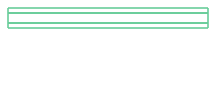

In [1374]:
#columns initially  - y axis is up and down, x left right, z into page
length=100
width=10
rotation = [0,0,0]
#rotation = [0,0, random.uniform(0, 2 * np.pi)]
seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotation)

xmaxseed = seedcrystal.max('x')
xminseed = seedcrystal.min('x')
ymaxseed = seedcrystal.max('y')
yminseed = seedcrystal.min('y')
zmaxseed = seedcrystal.max('z')
zminseed = seedcrystal.min('z')

print(xmaxseed, xminseed)
print(ymaxseed, yminseed)
print(zmaxseed, zminseed)

seedcrystal.plot()

###### Initialize a plate; note z is into/out of the page, y is up/vertical, therefore 'falling' into the page


0.231463474845 -0.187158246355 1.0756398608121143


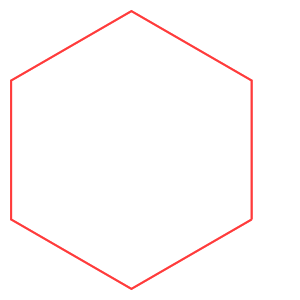

In [84]:
length =10 * 10 #c axis
width=30 * 10 #a axis
plates = width > length

f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[0,x,0]).projectxy().area
yrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x
f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[x,0,0]).projectxy().area
xrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x

xrotrand = random.uniform(-xrot, xrot)
yrotrand = random.uniform(-yrot, yrot)
zrot = random.uniform(0, 2 * np.pi)
print(xrotrand, yrotrand, zrot)

rotation = [0, 0, 0]            
#rotation = [xrotrand, yrotrand, zrot]

seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotation)

xmaxseed = seedcrystal.max('x')
xminseed = seedcrystal.min('x')
ymaxseed = seedcrystal.max('y')
yminseed = seedcrystal.min('y')
zmaxseed = seedcrystal.max('z')
zminseed = seedcrystal.min('z')

seedcrystal.plot()


In [ ]:
length=45.7088189615  * 10   #c axis 
width=4.67735141287  * 10 #a axis 

plates = width > length

f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[0,x,0]).projectxy().area
yrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x
f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[x,0,0]).projectxy().area
xrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x

yrotrand = random.uniform(-yrot, yrot)
xrotrand = random.uniform(-xrot, xrot)
rotation = [-49.6065032871*np.pi/180,  2.844*np.pi/180, random.uniform(0, 2 * np.pi)]

seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotation)


cluster = crys.IceCluster(seedcrystal)
#seedcrystal.rotate_to([np.pi/2,np.pi,np.pi])
seedcrystal.plot()

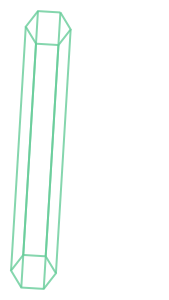

In [13]:
length=45.7088189615   * 10   #c axis 
width=4.67735141287 * 10 #a axis 

plates = width > length

f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[0,x,0]).projectxy().area
yrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x
f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[x,0,0]).projectxy().area
xrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x

yrotrand = random.uniform(-yrot, yrot)
xrotrand = random.uniform(-xrot, xrot)
rotation = [-123.6065032871*np.pi/180,  2.844*np.pi/180, random.uniform(0, 2 * np.pi)]

seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotation)


cluster = crys.IceCluster(seedcrystal)
#seedcrystal.rotate_to([np.pi/2,np.pi,np.pi])
seedcrystal.plot()

0.0684410208724 -1.2336016004
0.118576569628 -2.2111576751


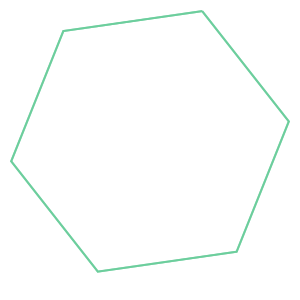

In [86]:
xrotrand = random.uniform(-xrot, xrot)
yrotrand = random.uniform(-yrot, yrot)
zrot = random.uniform(0, 2 * np.pi)
rotation = [xrotrand, yrotrand, zrot]
print(xrotrand*180./np.pi, yrotrand*180./np.pi)

new_crystal = crys.IceCrystal(length=length, width=width, rotation=rotation)
random_loc, lmax_bound = cluster.place_crystal(plates, new_crystal)  
new_crystal.move(random_loc)
#'----------------- add flow to new crystal -----------------')

#Calculate S ratio (how far apart the centers are, 0 = complete overlap, 1 = no overlap)              
S, lmax = cluster.calculate_S_ratio(plates, new_crystal)
#print('S1',S, lmax)

tilt_fracx, tilt_fracy = cluster.add_flow_tilt(new_crystal, lmax)                       

xrottilt = xrotrand + (xrotrand*tilt_fracx)
yrottilt = yrotrand + (yrotrand*tilt_fracy)
rotation = [xrottilt, yrottilt, zrot]
print(xrottilt*180./np.pi, yrottilt*180./np.pi)
new_crystal.rotate_to(rotation) 
#new_crystal.rotate_to([np.pi,np.pi/2,np.pi])            
new_crystal.plot()

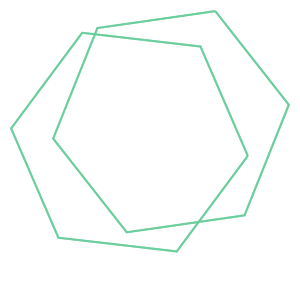

In [87]:


nmiss, max_misses = 0, 100
intersect = new_crystal.projectxy().centroid.within(lmax_bound)  
while intersect is False:                    
    nmiss += 1
    random_loc, lmax_bound = cluster.place_crystal(plates, new_crystal)  
    new_crystal.move(random_loc)          
    intersect = new_crystal.projectxy().centroid.within(lmax_bound)
    if nmiss > max_misses:
        ('%d > %d' %(nmiss, max_misses))
        break

crystal_hit = cluster.add_crystal_from_above(new_crystal, lodge=0) # returns false if the crystal misses
if crystal_hit:
    cluster.recenter()                           
#cluster.rotate_to([np.pi/2,np.pi,np.pi/2])
cluster.plot()

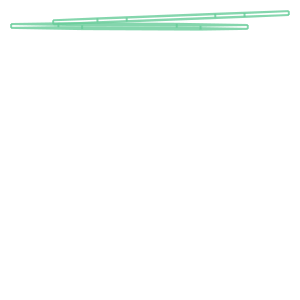

In [88]:
#View the cluster from the side

#if plates:
#    cluster.reorient()

cluster.rotate_to([np.pi/2,np.pi,np.pi])
cluster.plot()

In [89]:
seedcrystal.rotate_to([np.pi/2,np.pi,np.pi])
seedcrystal.plot()
print(seedcrystal.points)


[(  8.74559317e+02,  16.42772855,   504.9270571)
 (  8.74559317e+02,  16.42772855,  -504.9270571)
 (  2.10845230e-13,  16.42772855, -1009.8541142)
 ( -8.74559317e+02,  16.42772855,  -504.9270571)
 ( -8.74559317e+02,  16.42772855,   504.9270571)
 ( -1.86711757e-13,  16.42772855,  1009.8541142)
 (  8.74559317e+02, -16.42772855,   504.9270571)
 (  8.74559317e+02, -16.42772855,  -504.9270571)
 (  1.86711757e-13, -16.42772855, -1009.8541142)
 ( -8.74559317e+02, -16.42772855,  -504.9270571)
 ( -8.74559317e+02, -16.42772855,   504.9270571)
 ( -2.10845230e-13, -16.42772855,  1009.8541142)]


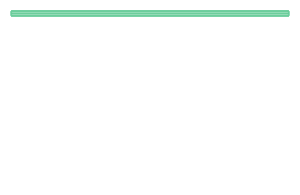

In [1345]:
new_crystal.rotate_to([np.pi/2,np.pi,np.pi])
new_crystal.plot()

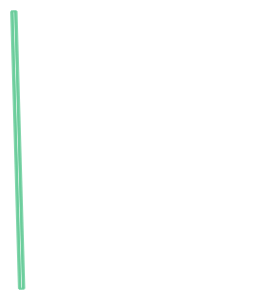

In [1347]:
S, lmax = cluster.calculate_S_ratio(plates, new_crystal)
#print('S1',S, lmax)                

tilt_fracx, tilt_fracy = cluster.add_flow_tilt(new_crystal, lmax)                       

xrottilt = xrotrand + (xrotrand*tilt_fracx)
yrottilt = yrotrand + (yrotrand*tilt_fracy)
rotation = [xrottilt, yrottilt, zrot]

new_crystal.rotate_to(rotation) 
new_crystal.rotate_to([np.pi/2,np.pi,np.pi])
new_crystal.plot()

no tilt

In [82]:
length=70.642772855  * 10   #c axis 
width=30.9854114199 * 10 #a axis 

f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[0,x,0]).projectxy().area
yrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x
f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[x,0,0]).projectxy().area
xrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x

rotations = [xrot,yrot,0]
seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotations)

cluster = crys.IceCluster(seedcrystal)

xrot = random.uniform(-xrot, xrot)
yrot = random.uniform(-yrot, yrot)
zrot = random.uniform(0, 2 * np.pi)
rotationn = [xrot, yrot, zrot]

length=70.642772855  * 10   #c axis 
width=10.9854114199 * 10 #a axis 

new_crystal = crys.IceCrystal(length=length, width=width, rotation=rotationn)
random_loc, lmax_bound = cluster.place_crystal(plates, new_crystal)  
new_crystal.move(random_loc)

crystal_hit = cluster.add_crystal_from_above(new_crystal, lodge=0) # returns false if the crystal misses

cluster.rotate_to([np.pi/2,np.pi,np.pi/2])
                
cluster.plot()

NameError: name 'plates' is not defined

With tilt

In [81]:
#rotation = [xrot, yrot, zrot]
#new_crystal = crys.IceCrystal(length=length, width=width, rotation=rotation)
#'----------------- add flow to new crystal -----------------')

#Calculate S ratio (how far apart the centers are, 0 = complete overlap, 1 = no overlap)              
#rotation = [0,np.pi/2,np.pi/2]

length=70.642772855  * 10   #c axis 
width=30.9854114199 *10
seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotations)

cluster = crys.IceCluster(seedcrystal)


S, lmax = cluster.calculate_S_ratio(plates, new_crystal)

tilt_fracx, tilt_fracy = cluster.add_flow_tilt(new_crystal, lmax)                       
print(xrot*180/np.pi, yrot*180/np.pi)
xrottilt = xrot + (xrot*tilt_fracx)
yrottilt = yrot + (yrot*tilt_fracy)
print(xrottilt*180/np.pi, 180/np.pi*yrottilt)
rotation = [xrottilt, yrottilt, zrot]
new_crystal.move(random_loc)
new_crystal.rotate_to(rotation) 

crystal_hit = cluster.add_crystal_from_above(new_crystal, lodge=0) # returns false if the crystal misses
cluster.rotate_to([np.pi/2,np.pi,np.pi/2])

cluster.plot()

NameError: name 'rotations' is not defined

In [66]:
from descartes.patch import PolygonPatch
from shapely.geometry import Point
import descartes
'''
seedcrystal = np.array([( 35.34468993, -18.54949695,  36.13741335),
  (  3.61692765, -43.1594362 ,  12.85362756),
  (-33.11133611, -21.847645  ,  -5.88875454),
  (-38.1118376 ,  24.07408545,  -1.34735085),
  ( -6.38407532,  48.6840247 ,  21.93643495),
  ( 30.34418845,  27.3722335 ,  40.67881705),
  ( 34.86830612, -18.67911707,  36.92356281),
  (  3.14054384, -43.28905631,  13.63977701),
  (-33.58771992, -21.97726511,  -5.10260509),
  (-38.58822141,  23.94446534,  -0.56120139),
  ( -6.86045913,  48.55440458,  22.7225844 ),
  ( 29.86780463,  27.24261338,  41.4649665 )],
   dtype=[('x', float), ('y', float), ('z', float)])
                        
new_crystal= np.array([(  5.08039837,  40.59211766, -34.18012737),
  ( 19.71051717,  30.80201422,   8.76807618),
  ( 16.67586239, -12.57906934,  24.99481798),
  ( -0.98891119, -46.17004947,  -1.72664378),
  (-15.61902998, -36.37994603, -44.67484734),
  (-12.58437521,   7.00113753, -60.90158913),
  (  4.23244266,  40.77508108, -33.84956818),
  ( 18.86256146,  30.98497764,   9.09863538),
  ( 15.82790668, -12.39610592,  25.32537717),
  ( -1.83686689, -45.98708605,  -1.39608459),
  (-16.46698569, -36.19698261, -44.34428814),
  (-13.43233091,   7.18410096, -60.57102994)],
   dtype=[('x', float), ('y', float), ('z', float)])
'''
cluster = np.array([[(  48.37269352,  83.0832184 , -25.42167456),
  (  46.09809079,  85.01707676, -26.46396734),
  (  45.57556552,  85.31471362, -29.56854133),
  (  47.32764298,  83.67849212, -31.63082253),
  (  49.60224571,  81.74463376, -30.58852975),
  (  50.12477098,  81.4469969 , -27.48395576),
  ( -83.11494166, -67.42156182, -17.7201859 ),
  ( -85.38954439, -65.48770345, -18.76247869),
  ( -85.91206966, -65.19006659, -21.86705268),
  ( -84.1599922 , -66.82628809, -23.92933388),
  ( -81.88538947, -68.76014646, -22.88704109),
  ( -81.3628642 , -69.05778332, -19.78246711)],
 [( -61.225545  , -28.52603135, -52.86364395),
  ( -61.89274113, -25.46867522, -53.3190809 ),
  ( -63.9060092 , -23.98439894, -51.38422286),
  ( -65.25208113, -25.55747879, -48.99392787),
  ( -64.58488499, -28.61483492, -48.53849092),
  ( -62.57161693, -30.0991112 , -50.47334896),
  (  90.99965126,  22.46199855,  66.41632265),
  (  90.33245512,  25.51935468,  65.9608857 ),
  (  88.31918706,  27.00363095,  67.89574374),
  (  86.97311513,  25.4305511 ,  70.28603873),
  (  87.64031126,  22.37319497,  70.74147568),
  (  89.65357933,  20.88891869,  68.80661763)],
 [( 104.12622558,  -3.16841453,   2.68705986),
  ( 104.48814197,  -2.95091976,   5.82102102),
  ( 104.47715696,  -0.11540771,   7.22093199),
  ( 104.10425557,   2.50260957,   5.4868818 ),
  ( 103.74233918,   2.2851148 ,   2.35292064),
  ( 103.75332418,  -0.55039725,   0.95300967),
  ( -94.06452701, -15.66405963,  26.44173186),
  ( -93.70261062, -15.44656486,  29.57569301),
  ( -93.71359563, -12.61105281,  30.97560399),
  ( -94.08649702,  -9.99303552,  29.2415538 ),
  ( -94.44841341, -10.21053029,  26.10759264),
  ( -94.43742841, -13.04604235,  24.70768167)],
  [(  79.41706888, -46.81495617,  19.34300856),
 (  78.71837007, -45.04873856,  21.87130746),
 (  78.41270805, -41.91520584,  21.57543012),
 (  78.80574485, -40.54789072,  18.75125388),
 (  79.50444366, -42.31410832,  16.22295498),
 (  79.81010567, -45.44764105,  16.51883232),
 (-115.61395624, -69.43632685, -18.75125388),
 (-116.31265504, -67.67010925, -16.22295498),
 (-116.61831706, -64.53657652, -16.51883232),
 (-116.22528027, -63.1692614 , -19.34300856),
 (-115.52658146, -64.93547901, -21.87130746),
 (-115.22091944, -68.06901173, -21.57543012)]],
 dtype=[('x', float), ('y', float), ('z', float)])

def projectxy(xtal):
    return geom.MultiPoint(xtal[['x', 'y']]).convex_hull

seedcrystal = cluster[0:2]
new_crystal = cluster[3]
lmax_bound = projectxy(seedcrystal).centroid.buffer(lmax)
bound = projectxy(new_crystal).centroid.within(lmax_bound)
print(bound)
   
crystals = [seedcrystal, new_crystal]

fig = plt.figure(1, figsize=(5,5))
ax = fig.add_subplot(111)
area = []
centroid = []
dmax = []
n=0
for i in crystals:    
 
    projpoly = projectxy(i)
    area.append(projpoly.area)
    centroid.append(projpoly.centroid)
    if n == 0:
        color='#29568F'
        zorder = 1
        linecolor = '#29568F'


    else:
        zorder = 2
        color='#e65c00'
        linecolor = '#e65c00'

    n+=1

    cryspatch = PolygonPatch(projpoly, fill=True, ec='k', fc=color, zorder=zorder,  alpha=0.9)     
    ax.add_patch(cryspatch)
    
    x, y = list(projpoly.exterior.coords.xy)
    start = Point(x[0],y[0])
    d = []
    for i in range(len(x)):
        d.append(start.distance(Point(x[i],y[i])))  
    #print(d1)
    maxind = np.argmax(d)
    #print(np.argmax(d))
    dmax.append(max(d))
    #print(d)
    end = Point(x[maxind],y[maxind])
    ax.plot(x,y, 'o',color ='w', linewidth = 3)  
    ax.plot([x[0],x[maxind]],[y[0], y[maxind]], color ='w', linewidth = 3)  

    
    
    
ax.plot([centroid[0].x, centroid[1].x],[centroid[0].y,centroid[1].y], color= 'gold',linewidth = 4)


rel_area = projectxy(crystals[0]).intersection(projectxy(crystals[1]))
ovrlpptch = PolygonPatch(rel_area, fill=True, ec='k', fc='k', zorder=zorder) 
ax.add_patch(ovrlpptch)

l = centroid[0].distance(centroid[1]) 
S = 2*l/(dmax[0]+dmax[1])
lmax = 0.6*(dmax[0]+dmax[1])/2 #force S = .6 for plates
lmax_bound = projectxy(crystals[0]).centroid.buffer(lmax)  #new crystal center can't be outside of this circle
ax.add_patch(descartes.PolygonPatch(lmax_bound, fc='b', ec='k', alpha=0.4))
#i = 0
#while i < 1000:
#    angle = random.uniform(0, 1) * np.pi * 2
#    radius = np.sqrt(random.uniform(0, 1)) * lmax
#    originX = lmax_bound.centroid.xy[0]
#    originY = lmax_bound.centroid.xy[1]

#    x = originX + radius * np.cos(angle)
#    y = originY + radius * np.sin(angle)
#    plt.scatter(x[0],y[0], color ='g', s=10, zorder = 10)  
#    i+=1

nmisses = 100
n = 0
while n < nmisses: 
    if centroid[1].within(lmax_bound):

        xmin = min(lmax_bound.exterior.coords.xy[0])
        xmax = max(lmax_bound.exterior.coords.xy[0])            
        ymin = min(lmax_bound.exterior.coords.xy[1])
        ymax = max(lmax_bound.exterior.coords.xy[1])
        #print(xmin, xmax, ymin, ymax)
        #print(centroid[1])
        square = geom.Polygon([(xmin,ymax),(xmax, ymax),(xmax, ymin),(xmin,ymin)])

        pctovrlp = (2*rel_area.area/(area[0]+area[1]))*100
        pctovrlp1 = (rel_area.area/(area[0]+area[1]-rel_area.area))*100
        pctovrlp2 = (rel_area.area/area[0])*100

        print(pctovrlp, pctovrlp1, pctovrlp2, S)
        break
    else:
        n+=1
ax.add_patch(descartes.PolygonPatch(square, fc='gray', ec='k', alpha=0.4))

ax.axis('scaled')
plt.show()

AssertionError: 

AttributeError: 'numpy.ndarray' object has no attribute 'projectxy'

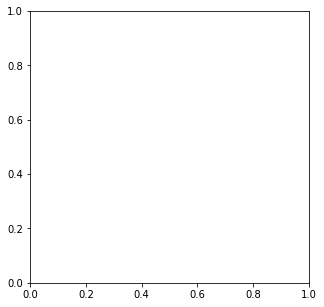

In [157]:
from descartes.patch import PolygonPatch
from shapely.geometry import Point
import descartes

crystals = [seedcrystal, new_crystal]

fig = plt.figure(1, figsize=(5,5))
ax = fig.add_subplot(111)
area = []
centroid = []
dmax = []
for i in crystals:    
 
    projpoly = i.projectxy()
    area.append(projpoly.area)
    centroid.append(projpoly.centroid)
    if i == seedcrystal:
        color='#29568F'
        zorder = 1
        linecolor = '#29568F'


    else:
        zorder = 2
        color='#e65c00'
        linecolor = '#e65c00'



    cryspatch = PolygonPatch(projpoly, fill=True, ec='k', fc=color, zorder=zorder,  alpha=0.9)     
    ax.add_patch(cryspatch)
    
    x, y = list(projpoly.exterior.coords.xy)
    start = Point(x[0],y[0])
    d = []
    for i in range(len(x)):
        d.append(start.distance(Point(x[i],y[i])))  
    #print(d1)
    maxind = np.argmax(d)
    #print(np.argmax(d))
    dmax.append(max(d))
    #print(d)
    end = Point(x[maxind],y[maxind])
    ax.plot(x,y, 'o',color ='w', linewidth = 3)  
    ax.plot([x[0],x[maxind]],[y[0], y[maxind]], color ='w', linewidth = 3)  

ax.plot([centroid[0].x, centroid[1].x],[centroid[0].y,centroid[1].y], color= 'gold',linewidth = 4)


rel_area = seedcrystal.projectxy().intersection(new_crystal.projectxy())
ovrlpptch = PolygonPatch(rel_area, fill=True, ec='k', fc='k', zorder=zorder) 
ax.add_patch(ovrlpptch)

l = centroid[0].distance(centroid[1]) 
S = 2*l/(dmax[0]+dmax[1])
lmax = 0.6*(dmax[0]+dmax[1])/2 #force S = .6 for plates
lmax_bound = seedcrystal.projectxy().centroid.buffer(lmax)  #new crystal center can't be outside of this circle
ax.add_patch(descartes.PolygonPatch(lmax_bound, fc='b', ec='k', alpha=0.4))

nmisses = 100
n = 0
while n < nmisses: 
    if centroid[1].within(lmax_bound):

        xmin = min(lmax_bound.exterior.coords.xy[0])
        xmax = max(lmax_bound.exterior.coords.xy[0])            
        ymin = min(lmax_bound.exterior.coords.xy[1])
        ymax = max(lmax_bound.exterior.coords.xy[1])
        #print(xmin, xmax, ymin, ymax)
        #print(centroid[1])
        square = geom.Polygon([(xmin,ymax),(xmax, ymax),(xmax, ymin),(xmin,ymin)])

        pctovrlp = (2*rel_area.area/(area[0]+area[1]))*100
        pctovrlp1 = (rel_area.area/(area[0]+area[1]-rel_area.area))*100
        pctovrlp2 = (rel_area.area/area[0])*100

        print(pctovrlp, pctovrlp1, pctovrlp2, S)
        break
    else:
        n+=1
ax.add_patch(descartes.PolygonPatch(square, fc='gray', ec='k', alpha=0.4))

ax.axis('scaled')
plt.show()

0
1


{'angle': -172.95698313819031,
 'height': 87.045702262281523,
 'width': 133.16548150977405,
 'xy': [0.03951091652164683, -0.05700895847829408]}

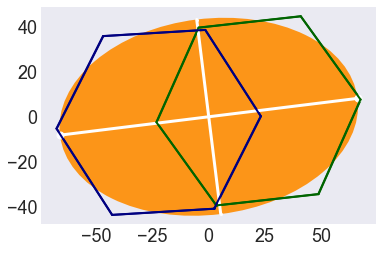

In [717]:
cluster.plot_ellipse([['x','y']])

if plates:
    cluster.rotate_to([np.pi/2,np.pi,np.pi/2])  #view side -- z axis up down y axis left right
else:
    #no rotation = x,z
    cluster.rotate_to([np.pi/2,0,0]) #y left right,z up down
    #cluster.rotate_to([np.pi/2,np.pi/2,np.pi/2])  #z,y

cluster.rotate_to([np.pi/2,np.pi,np.pi/2])  #view side 

# Contact Angle - work in progress from before

In [113]:
import scipy.optimize as opt
import random
import numpy as np
import ipas.lab_opt_rot as lab
import ipas.crystals_opt_rot as crys


#length=13.6790022746 * 10
#width=8.55013140036 * 10

length=50.6 * 10
width=100.5 * 10

rotations= 100
plates = width > length

f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[0,x,0]).projectxy().area
yrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x
f = lambda x: -crys.IceCrystal(length=length, width=width, rotation=[x,0,0]).projectxy().area
xrot = opt.minimize_scalar(f, bounds=(0, np.pi/2), method='Bounded').x

print('xrot,yrot',xrot,yrot)
rotation = [0, yrot, random.uniform(0, 2 * np.pi)]
dimarr = ['y','z']
dim = 'y'
dim_up = 'z'
dimind = 0
dimindup = 1

if plates:
    hypot = width
else:
    hypot = length
    
#print('yrot',yrot)
#rotation = [0,np.pi/2,np.pi/2-1.0]
zrotseed = rotation[2]*180/np.pi
print('zrotseed',zrotseed)

seedcrystal = crys.IceCrystal(length=length, width=width, rotation=rotation)
cluster = crys.IceCluster(seedcrystal)

xmax = cluster.max('x')
ymax = cluster.max('y')
zmax = cluster.max('z')
xmin = cluster.min('x')
ymin = cluster.min('y')
zmin = cluster.min('z') 

ncrystals = 2
while cluster.ncrystals < ncrystals:
    
    rotation = [0, yrot, random.uniform(0, 2 * np.pi)]
    #rotation = [0,np.pi/2,np.pi/2+.9]
    zrotnew = rotation[2]*180/np.pi
    print('zrotnew',zrotnew)
    new_crystal = crys.IceCrystal(length=length, width=width, rotation=rotation)
    random_loc = [random.uniform(xmin, xmax), random.uniform(ymin, ymax), 0]
    new_crystal.move(random_loc)

    crystal_hit = cluster.add_crystal_from_above(new_crystal)   

    if crystal_hit:
        cluster.recenter()

        height_seed = seedcrystal.maxz - seedcrystal.minz   
        height_new = new_crystal.maxz - new_crystal.minz
        checkposseed = False
        checkposnew = False
        checknegseed = False
        checknegnew = False

        xmaxseed = seedcrystal.max(dim)
        xminseed = seedcrystal.min(dim)
        pointszseed = seedcrystal.points[dim_up]
        pointsxseed = seedcrystal.points[dim]
        maxzindseed = np.where(pointszseed == seedcrystal.max(dim_up))
        minzindseed = np.where(pointszseed == seedcrystal.min(dim_up))
        xatmaxzseed = max(seedcrystal.points[dim][maxzindseed])
        xatminzseed = min(seedcrystal.points[dim][minzindseed])
        maxxindseed = np.where(pointsxseed == xmaxseed)
        minxindseed = np.where(pointsxseed == xminseed)
        zatmaxxseed = max(pointszseed[maxxindseed])
        zatminxseed = min(pointszseed[minxindseed])

        #print('-----------------new crys-------------------')
        xmaxnew = new_crystal.max(dim)
        xminnew = new_crystal.min(dim)
        pointsznew = new_crystal.points[dim_up]
        pointsxnew = new_crystal.points[dim]
        maxzindnew = np.where(pointsznew == new_crystal.max(dim_up))
        minzindnew = np.where(pointsznew == new_crystal.min(dim_up))
        xatmaxznew = max(new_crystal.points[dim][maxzindnew])
        xatminznew = min(new_crystal.points[dim][minzindnew])
        maxxindnew = np.where(pointsxnew == xmaxnew) 
        minxindnew = np.where(pointsxnew == xminnew) 
        zatmaxxnew = max(pointsznew[maxxindnew])
        zatminxnew = min(pointsznew[minxindnew])


        crystals = [seedcrystal, new_crystal]
        slope=[]
        hexmax = []
        hexmin = []

        #fig = pl.figure(1, figsize=(5,5))
        #ax = fig.add_subplot(111)

        for i in crystals:
            # make a line connecting the two hexagons at the max x value  
            #this is to determine the slope of each crystal
            hex1pts = i.points[dimarr][0:6]  
            hex2pts = i.points[dimarr][6:12]  

            poly1 = geom.Polygon([[p[0], p[1]] for p in hex1pts])       
            poly2 = geom.Polygon([[p[0], p[1]] for p in hex2pts])

            #add patches here

            hex1max = max(hex1pts[dimarr],key=itemgetter(dimindup))
            hex1min = min(hex1pts[dimarr],key=itemgetter(dimindup))
            #print('hex1min',hex1min)
            #print('hex2pts',hex2pts)
            hex2max = max(hex2pts[dimarr],key=itemgetter(dimindup))
            hex2min = min(hex2pts[dimarr],key=itemgetter(dimindup))
            #print('hex2min',hex2min)

            #Plates: when the lines connecting the hexagons slope positive the crystal slopes negative
            #Columns: when the lines connecting the hexagons slope positive the crystal also slopes positive 
            if (hex2max[dimarr[dimindup]]-hex1max[dimarr[dimindup]])/(hex2max[dimarr[dimind]]-hex1max[dimarr[dimind]])>=0:
                if plates:
                    slope.append('negative')
                else:
                    slope.append('positive')
            else:
                if plates:
                    slope.append('positive')
                else:
                    slope.append('negative')

            #hexmaxval = min(hex2max[dimarr[dimind]],hex1max[dimarr[dimind]])
            hexminval = max(hex1min,hex2min,key=itemgetter(dimindup))
            #hexminval = max(hex2min[dimarr[dimind]],hex1min[dimarr[dimind]])
            hexmaxval = min(hex1max,hex2max,key=itemgetter(dimindup))

            hexmax.append(hexmaxval[dimarr[dimind]])
            hexmin.append(hexminval[dimarr[dimind]])
        #----------------------------------------------------------------
        #Determine what slope each crystal has and calculate the seed_ang/
        #new_ang for each crystal
        if slope[0] == 'negative': #neg slope
            checknegseed = True
            #print('checknegseed')
            if plates:
                baseseed = hexmax[0] - xminseed
            else:
                baseseed = xatminzseed - hexmin[0]
            #print('baseseed neg', baseseed)
            #print('xatminzseed, hexmin[0]', xatminzseed,hexmin[0])
            #print('hexmin[0], hexmax[0]',hexmin[0], hexmax[0])
            seed_ang = np.arccos(baseseed/hypot)*(180./np.pi)          

        else:
            checkposseed = True 
            #print('checkposseed')
            if plates:
                baseseed = xmaxseed - hexmin[0]
            else:
                baseseed = hexmin[0] - xatminzseed   
            #print('baseseed pos',baseseed)
            #print('hexmax, xatminzseed',hexmax[0], xatminzseed)
            seed_ang = np.arccos(baseseed/hypot)*(180./np.pi) 


        if slope[1]=='negative':
            checknegnew = True
            #print('checknegnew')
            if plates:
                basenew = hexmax[1] - xminnew
            else:
                basenew = xatminznew - hexmin[1]
            #print('base',basenew, hypot)
            #print('hexmin, xatminznew',hexmin[1], xatminznew)
            new_ang = np.arccos(basenew/hypot)*(180./np.pi) 

        else: #pos slope

            checkposnew = True
            #print('checkposnew')

            if plates:
                basenew = xmaxnew - hexmin[1]
            else:
                basenew = hexmin[1] - xatminznew
            #print('base, hypot',basenew, hypot)
            #print('hexmin, xatminznew',hexmin[1], xatminznew)    
            new_ang = np.arccos(basenew/hypot)*(180./np.pi) 

        ##################################################################################    

        #Check if overlap is minimal and don't subtract from 180

        #horizontal overlap
        in_out = ['y','x','z','x']
        percent = []
        for i in range(2):
            xmax = cluster.max(in_out[i])
            xmin = cluster.min(in_out[i])
            xmaxseed = seedcrystal.max(in_out[i])
            xminseed = seedcrystal.min(in_out[i])
            xmaxnew = new_crystal.max(in_out[i])
            xminnew = new_crystal.min(in_out[i])
            widclus = xmax-xmin
            widseed = xmaxseed - xminseed
            widnew = xmaxnew - xminnew
            #print(widclus, xmax, xmin)


            Sx = widclus - (widclus - widseed) - (widclus - widnew)
            if plates:
                percentage = (Sx / widclus)*100   
            else:
                percentage = (Sx / widclus)*100
            percent.append(percentage)

        #print('X overlap', percent[1])
        #print('Y overlap', percent[0])

        zmax = cluster.max(dim_up)
        zmin = cluster.min(dim_up)
        plates = width > length
        height_seed = seedcrystal.max(dim_up) - seedcrystal.min(dim_up)   
        height_new = new_crystal.max(dim_up) - new_crystal.min(dim_up)              
        heightclus = zmax-zmin #0 index is x
        Sz = heightclus - (heightclus - height_seed) - (heightclus - height_new)    
        if plates:
            percentage = (Sz / heightclus)*100   
        else:
            percentage = (Sz / heightclus)*100
        percent.append(percentage)
        #print('vert_overlap', percent[2])


        cont_ang = new_ang + seed_ang
        cont_ang1 = new_ang + seed_ang
        #print('cont_ang b4 if1', cont_ang)
        if ((checkposseed == True and checkposnew == True) or (checknegseed == True and checknegnew == True)):  
            #print('in if1 -- crystals slope in same direction')
            seed1_ang = 90. - seed_ang
            cont_ang = 90. - new_ang - seed1_ang
            if1flag = True

        cont_ang = abs(cont_ang)
        #print('cont_ang b4 if2', cont_ang)
        if cont_ang1 > 90 and percent[1] > 20.0 and cont_ang < 90:
            #print('in if2')
            cont_ang = 180 - cont_ang

        #---------umcomment this for different cluster views------
        if plates:
            cluster.rotate_to([np.pi/2,np.pi,np.pi/2])  #view side -- z axis up down y axis left right
        else:
            #no rotation = x,z
            cluster.rotate_to([np.pi/2,0,0]) #y left right,z up down
            #cluster.rotate_to([np.pi/2,np.pi/2,np.pi/2])  #z,y

        #print('seed, new final',seed_ang,new_ang)
        #print('contact angle',cont_ang)
        cluster.rotate_to([np.pi/2,np.pi,np.pi/2])  #view side 
cluster.plot()

AttributeError: module 'ipas' has no attribute 'crystals_opt_rot'

#### Plot specific aggregates out of numclusters

In [132]:
import ipas.crystals as ipas
#seedcrystal = ipas.IceCrystal(length=100, width=6, rotation=(0,np.pi/2-.1,0))
#cluster = ipas.IceCluster([seedcrystal])
instance = p300.clusters[0]
instance.rotate_to([np.pi/2,0,np.pi/2])
instance.plot()

AttributeError: 'Make_Plots' object has no attribute 'clusters'

In [40]:
import matplotlib.pyplot as plt
plt.close("all")

In [69]:
phio=np.logspace(-2, 2, num=30, endpoint=True, base=10.0, dtype=None)
np.set_printoptions(suppress=True)
print(phio)


[   0.01          0.01373824    0.01887392    0.02592944    0.03562248
    0.04893901    0.06723358    0.09236709    0.1268961     0.17433288
    0.23950266    0.32903446    0.45203537    0.62101694    0.85316785
    1.1721023     1.61026203    2.21221629    3.03919538    4.17531894
    5.73615251    7.88046282   10.82636734   14.87352107   20.43359718
   28.07216204   38.56620421   52.98316906   72.78953844  100.        ]


In [88]:
phio=np.logspace(-2, 2., num=20, endpoint=True, base=10.0, dtype=None)#just columns (0,2); plates (-2,2)
np.set_printoptions(suppress=True)
add = [.32, .43, .54, .62, .73, .84, .95, 2.2, 3.3, 4.4]
phio = np.append(phio, add, axis=0) 
print(sorted(phio))


[0.01, 0.016237767391887217, 0.026366508987303583, 0.042813323987193938, 0.069519279617756058, 0.11288378916846889, 0.18329807108324356, 0.29763514416313175, 0.32000000000000001, 0.42999999999999999, 0.48329302385717521, 0.54000000000000004, 0.62, 0.72999999999999998, 0.78475997035146106, 0.83999999999999997, 0.94999999999999996, 1.2742749857031335, 2.0691380811147901, 2.2000000000000002, 3.2999999999999998, 3.3598182862837809, 4.4000000000000004, 5.4555947811685144, 8.8586679041008232, 14.384498882876629, 23.357214690901213, 37.92690190732246, 61.584821106602604, 100.0]


In [178]:
phioadd=np.logspace(-.301, .301, num=10, endpoint=True, base=10.0, dtype=None)
print(phioadd)

[ 0.50003453  0.58329585  0.68042111  0.7937188   0.92588182  1.08005145
  1.25989204  1.4696781   1.71439587  1.99986187]


In [5]:
phio=np.logspace(-2, 2., num=50, endpoint=True, base=10.0, dtype=None)
np.set_printoptions(suppress=True)
print(phio)

[   0.01          0.01206793    0.01456348    0.01757511    0.02120951
    0.02559548    0.03088844    0.03727594    0.04498433    0.05428675
    0.06551286    0.07906043    0.09540955    0.11513954    0.13894955
    0.16768329    0.20235896    0.24420531    0.29470517    0.35564803
    0.42919343    0.51794747    0.62505519    0.75431201    0.91029818
    1.09854114    1.32571137    1.59985872    1.93069773    2.32995181
    2.8117687     3.39322177    4.09491506    4.94171336    5.96362332
    7.19685673    8.68511374   10.48113134   12.64855217   15.26417967
   18.42069969   22.22996483   26.82695795   32.37457543   39.06939937
   47.14866363   56.89866029   68.6648845    82.86427729  100.        ]
